<img alt="Colaboratory logo" width="15%" src="https://raw.githubusercontent.com/carlosfab/escola-data-science/master/img/novo_logo_bg_claro.png">

#### **Data Science na Prática 2.0**
*by [sigmoidal.ai](https://sigmoidal.ai)*

---

# Análise dos Dados do Airbnb - *Paris*

O [Airbnb](https://www.airbnb.com.br/) já é considerado como sendo a **maior empresa hoteleira da atualidade**. Ah, o detalhe é que ele **não possui nenhum hotel**!

Conectando pessoas que querem viajar (e se hospedar) com anfitriões que querem alugar seus imóveis de maneira prática, o Airbnb fornece uma plataforma inovadora para tornar essa hospedagem alternativa.

No final de 2018, a Startup fundada 10 anos atrás, já havia **hospedado mais de 300 milhões** de pessoas ao redor de todo o mundo, desafiando as redes hoteleiras tradicionais.

Uma das iniciativas do Airbnb é disponibilizar dados do site, para algumas das principais cidades do mundo. Por meio do portal [Inside Airbnb](http://insideairbnb.com/get-the-data.html), é possível baixar uma grande quantidade de dados para desenvolver projetos e soluções de *Data Science*.

<center><img alt="Analisando Airbnb" width="10%" src="https://www.area360.com.au/wp-content/uploads/2017/09/airbnb-logo.jpg"></center>

**Neste *notebook*, iremos analisar os dados referentes à cidade *Paris*, e ver quais insights podem ser extraídos a partir de dados brutos.**

Paris tem a maior listagem do Airbnb do que qualquer outra cidade do mundo. São mais de 52.000 anúncios, sendo 86% deles casas inteiras. O conjunto de dados possui mais de 60.000 listagens

## Obtenção dos Dados

Os dados utilizados nesse *notebook* foram retirados do site [Inside Airbnb](http://insideairbnb.com/get-the-data.html).

Para essa análise, inicial, será utilizado o `listings.csv`, que é um conjunto de dados resumido. Será utilizado um *dataset* menor para que seja possível ter uma noção dos dados e, em uma análise posterior, abranger.

In [1]:
# importar os pacotes necessarios
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

In [2]:
# importar o arquivo listings.csv para um DataFrame
df = pd.read_csv('http://data.insideairbnb.com/france/ile-de-france/paris/2020-12-14/visualisations/listings.csv')

## Análise dos Dados

A etapa de análise de dados tem como objetivo criar consciência situacional, permitindo o entendimento dos dados presentes no *dataset*.

**Dicionário das variáveis**

* `id`: Número do *ID* gerado para identificar cada imóvel;
* `name`: Nome anunciado da propriedade;
* `host_id`: Número de *ID* do proprietário da propriedade;
* `host_name`: Nome do proprietário;
* `neighbourhood_group`: Grupo de bairro. Essa coluna não possue nenhum valor válido;
* `neighbourhood`: Nome do bairro;
* `latitude`: Coordenada de latitude da propriedade;
* `longitude`: Coordenada de longitude da propriedade;
* `room_type`: Tipo de quarto que está sendo oferecido;
* `price`: Preço do aluguel;
* `minimum_nights`: Número mínimo de noites para poder reservar;
* `number_of_reviews`: Quantidade de *reviews* que a propriedade recebeu;
* `last_review`: Data do último *review*;
* `reviews_per_month`: Quantidade de *reviews* recebido por mês;
* `calculated_host_listings_count`: Quantidade de imóveis do mesmo proprietário;
* `availability_365`: Número de dias disponíveis durante 365 dias.

Antes de iniciar qualquer análise, vamos verificar a cara do nosso *dataset*, analisando as 5 primeiras entradas.

In [3]:
# mostrar as 5 primeiras entradas
df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2577,Loft for 4 by Canal Saint Martin,2827,Karine,NaN,Entrepôt,48.86993,2.36251,Entire home/apt,125,3,1,2019-01-02,0.04,1,364
1,3109,zen and calm,3631,Anne,NaN,Observatoire,48.83349,2.31852,Entire home/apt,60,2,9,2019-10-24,0.19,1,2
2,4890,Quiet Historic & Cute +Free Cruise,6792,Ryan Of Cobblestone,NaN,Temple,48.86409,2.35651,Entire home/apt,69,5,23,2020-09-07,0.21,14,67
3,5396,Explore the heart of old Paris,7903,Borzou,NaN,Hôtel-de-Ville,48.85207,2.35871,Entire home/apt,62,1,231,2020-11-05,1.65,1,90
4,7397,MARAIS - 2ROOMS APT - 2/4 PEOPLE,2626,Franck,NaN,Hôtel-de-Ville,48.85758,2.35275,Entire home/apt,53,15,269,2020-08-15,2.28,3,348


### **Q1. Quantos atributos (variáveis) e quantas entradas o  conjunto de dados possui? Quais os tipos das variáveis?**

Com esse questionamento será possível identificar a quantidade de entradas que o conjunto de dados possui e ver o tipo de cada coluna presente. 

In [4]:
# identificar o volume de dados do DataFrame
print(f'Entradas: \t {df.shape[0]}')
print(f'Variáveis: \t {df.shape[1]}')

# verificar os tipos de cada coluna do Dataset
display(df.dtypes)

Entradas: 	 65917
Variáveis: 	 16


id                                  int64
name                               object
host_id                             int64
host_name                          object
neighbourhood_group               float64
neighbourhood                      object
latitude                          float64
longitude                         float64
room_type                          object
price                               int64
minimum_nights                      int64
number_of_reviews                   int64
last_review                        object
reviews_per_month                 float64
calculated_host_listings_count      int64
availability_365                    int64
dtype: object

### **Q2. Qual a porcentagem de valores ausentes no *dataset*?**

A qualiddade dos *datasets* são diretamente ligadas a quantidade de valores ausentes presentes nele, quanto mais valores ausentes menor será a qualidade. Portanto, é necessário entender logo no inçiio se os valores nulos possuem alguma importância ao comprar com o número total de entradas.

In [5]:
# ordenar em ordem decrescente as variáveis por seus valores ausentes
(df.isnull().sum() / df.shape[0]).sort_values(ascending = False)

neighbourhood_group               1.000000
reviews_per_month                 0.237996
last_review                       0.237996
name                              0.000971
host_name                         0.000425
availability_365                  0.000000
calculated_host_listings_count    0.000000
number_of_reviews                 0.000000
minimum_nights                    0.000000
price                             0.000000
room_type                         0.000000
longitude                         0.000000
latitude                          0.000000
neighbourhood                     0.000000
host_id                           0.000000
id                                0.000000
dtype: float64

É possível veer que algumas colunas possuem valores ausentes:

* `neighbourhood_group`: Todos os valores estão ausentes nessa coluna;
* `reviews_per_month` e `last_review`: Cerca de 24% de valores ausentes;
* `name` e `host_name`: Menos de 0,1% de valores ausentes.

Sabendo a quantidade de valores ausentes em cada coluna é possível tomar uma decisão sobre o que será feito em relação a esses valores. A coluna `neighbourhood_group`, por exemplo, pode ser toda retirada visto que ela não possui nenhum valor que não seja nulo.

### **Q3. Qual o tipo de distribuição das variáveis?** 

A fim de saber qual a distruição das variáveis será plotado um histograma.

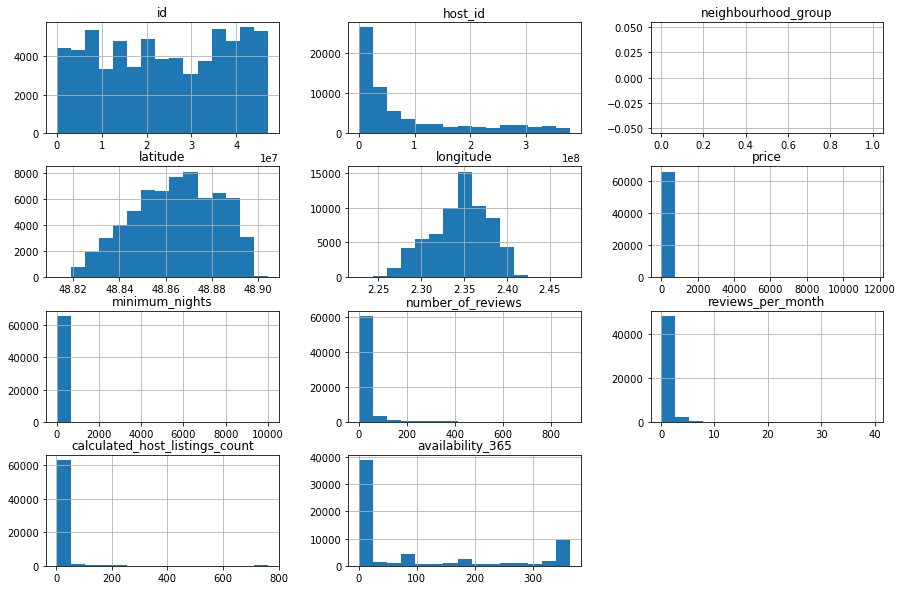

In [6]:
# plotar o histograma das variáveis numéricas
df.hist(bins = 15, figsize=(15, 10));

### Q4. Há *outliers* presente?

Ao analisar a distribuição do histograma percebe-se indícios de que há *outliers* presentes no *dataset*. Na coluna de `minimum_nights`está demonstrando que o há aluguéis que tem que ser alugados por no mínimo 100000 noites. Além dessa coluna tem a de `price` e `calculated_host_listings_count` que possuem valores máximos exorbitantes, esses valores não parecem condizer com realidade. 

Para confirmar a detecção de *outliers* será utilizadas duas técnicas:

* Utilizar o `describe()` para conseguir o resumo estatístico dos dados;
* Plotar um `boxplot` para visualizar no gráfico os *outliers*. 

In [7]:
#Ver o resumo estatístico das variáveis numéricas
df[['price', 'minimum_nights', 'number_of_reviews', 'reviews_per_month', 'calculated_host_listings_count', 'availability_365']].describe()

,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,65917.000000,65917.000000,65917.000000,50229.000000,65917.000000,65917.000000
mean,114.280201,5.656113,18.783394,0.689335,16.427098,96.354173
std,220.155923,44.279940,40.678117,0.983954,86.017717,137.362947
min,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000
25%,59.000000,1.000000,1.000000,0.130000,1.000000,0.000000
50%,80.000000,2.000000,5.000000,0.360000,1.000000,0.000000
75%,120.000000,4.000000,18.000000,0.870000,2.000000,179.000000
max,11600.000000,9999.000000,882.000000,39.620000,762.000000,365.000000


Ao olhar o resumo estatístico é possível confirmar algumas hipótese:

* A coluna `price` possui 75% dos valores abaixo de 120, mas o seu valor máximo é de 11600;
* Da mesma forma, até 75% o mínimo de noites requeridas é de 4, na coluna `minimum_nights`, mas o valor máximo presente nessa coluna é de 9999 noites mínimas;

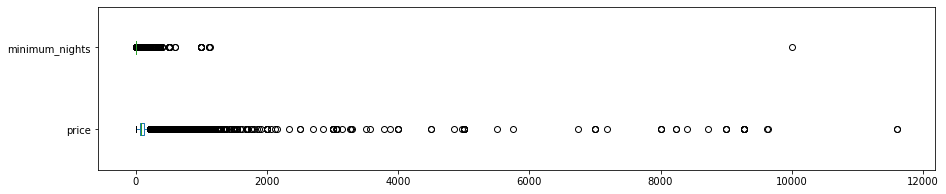


Minimum nights... Valores acima de 30.
906 entradas
1.3745%

Price... Valores acima de 500.
846 entradas
1.2834%


In [12]:
#Minimum_nights
df[['price', 'minimum_nights']].plot(kind = 'box', vert = False, figsize = (15, 3))
plt.show()

#Ver quantidade de valores acima de 30 dias para minimum_nights
print('\nMinimum nights... Valores acima de 30.')
print(f'{len(df[df.minimum_nights > 30])} entradas')
print(f'{(len(df[df.minimum_nights > 30])/df.shape[0])*100:.4f}%')

#Ver quantidade de valores acima de 500 para coluna price
print('\nPrice... Valores acima de 500.')
print(f'{len(df[df.price > 500])} entradas')
print(f'{(len(df[df.price > 500])/df.shape[0])*100:.4f}%')

Foi colocado um valor de corte para os dados, para a coluna `price` o preço de 500 e para a coluna `minimum_nights` acima de 30 dias, com isso percebe-se que valores acima desses são menos de 1,5% dos dados, então não terá prejuízo com a retirada deles.

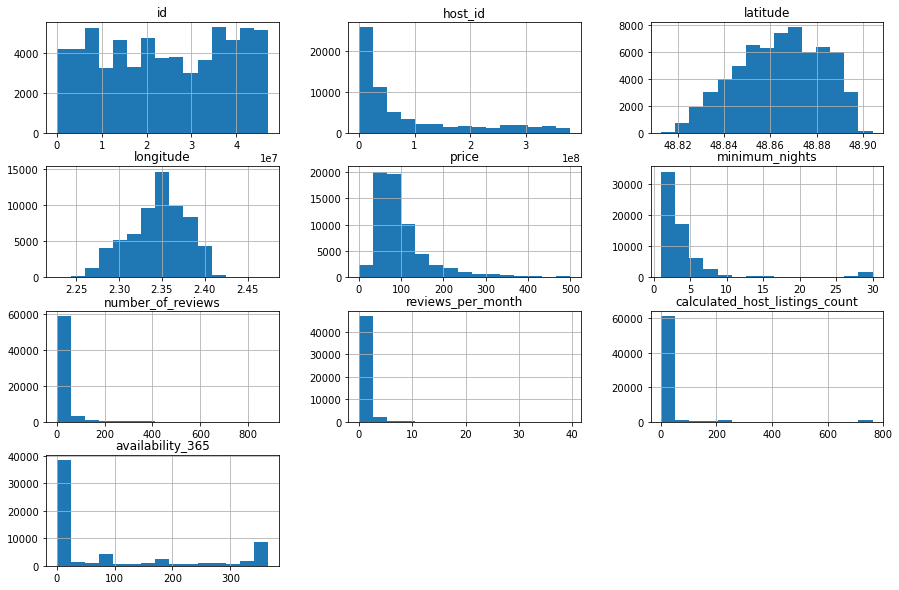

In [13]:
#Remover os outliers em novo DataFrame
df_clean = df.copy()
df_clean.drop(df_clean[df_clean.price > 500].index, axis = 0, inplace= True)
df_clean.drop(df_clean[df_clean.minimum_nights > 30].index, axis = 0, inplace=True)

#Remover neghbourhood_group, pois está vazio
df_clean.drop('neighbourhood_group', axis = 1, inplace=True)

#Plotar o histogram para as variáveis numéricas
df_clean.hist(bins=15, figsize=(15, 10));

Com a retirada dos valores o histograma plotado fica melhor, percebendo assim uma melhor distribuição de dados, sem *outliers* e proporcionando menores erros. 

### **Q4. Qual a correlação existente entre as variáveis**

Correlação é a relação entre duas coisas, nesse caso uma relação/semelhança entre duas variáveis.

A relação é medida em função do coeficiente de correlação que estabelece a intensidade dela. Esse coeficiente é representado por valores entre -1 e 1, onde os dois extremos representam o máximo de relação, ou seja, se duas variáveis possuem 0,9 de correlação uma depende muito da outra, mas se elas possuírem -0,9 elas andam em direções opostas. Em contrapartida, quanto mais próximo de 0, menor a relação de uma váriavel em relação a outra. 

Para medir a correlação entre as variáveis será feito:

* Uma matriz de correlação;
* Um *heatmap* a partir da matriz.

In [14]:
# criar uma matriz de correlação
corr = df_clean[['price', 'minimum_nights', 'number_of_reviews', 'reviews_per_month', 'calculated_host_listings_count', 'availability_365']].corr()

# mostrar a matriz de correlação
display(corr)

,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
price,1.000000,-0.017753,0.009991,0.010758,0.082587,0.225908
minimum_nights,-0.017753,1.000000,-0.050261,-0.095772,0.023470,0.116355
number_of_reviews,0.009991,-0.050261,1.000000,0.754998,-0.016240,0.201549
reviews_per_month,0.010758,-0.095772,0.754998,1.000000,0.019030,0.247855
calculated_host_listings_count,0.082587,0.023470,-0.016240,0.019030,1.000000,0.064563
availability_365,0.225908,0.116355,0.201549,0.247855,0.064563,1.000000


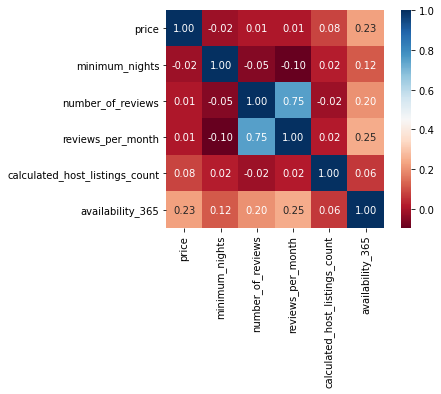

In [15]:
# plotar um heatmap a partir das correlações
sns.heatmap(corr, cmap='RdBu', fmt = '.2f', square=True, linecolor='white', annot=True);

As variáveis que possuem maior relação são `number_of_reviews` e `reviews_per_month`, com uma relação de 0.75. Essa relação de certa forma é esperada porque a quantidade de *reviews* por mês está diretamenete ligada a quantide de *reviews* que um imóvel recebe, por isso que essas duas variáveis possuem uma relação forte. 

### **Q5. Qual o tipo de imóvel mais alugado no Airbnb?**

Na coluna `room_type` há informações do tipo de locação anunciada no Airbnb. Quem já alugou no *site* sabe que há algumas opções de aluguel podendo ser casas/apartamentos inteiros, aluguel de um quarto apenas ou dividir quarto com outras pessoas. Utilizando essa coluna será feita uma contagem para descobrir qual o tipo de aluguel que é mais utilizado.

In [16]:
# mostrar a quantidade de cada tipo de imóvel disponível
df_clean.room_type.value_counts()

Entire home/apt    55056
Private room        7407
Hotel room          1304
Shared room          414
Name: room_type, dtype: int64

In [17]:
# mostrar a porcentagem de cada tipo de imóvel disponível
df_clean.room_type.value_counts() / df_clean.shape[0]

Entire home/apt    0.857824
Private room       0.115408
Hotel room         0.020318
Shared room        0.006451
Name: room_type, dtype: float64

Ao utilizar a função `value_counts()` percebe-se que o tipo de aluguel mais comum é o de casas/apartamentos inteiros.

### **Q6. Qual a localidade mais cara do dataset?**

Será utilizada a coluna 'neighbourhood` para descobrir qual o bairro que possui locações mais caras.

In [18]:
# ver preços por bairros, na média
df_clean.groupby(['neighbourhood']).price.mean().sort_values(ascending = False)[:10]

neighbourhood
Élysée            150.160434
Louvre            144.781592
Luxembourg        139.584395
Palais-Bourbon    137.774573
Hôtel-de-Ville    129.665590
Passy             126.786795
Temple            124.215845
Bourse            123.082821
Panthéon          115.899301
Opéra             110.664453
Name: price, dtype: float64

Fazendo a comparação pelo preço médio das locações percebe-se que todos os bairros possuem uma faixa de preço semelhante, variando de 110 até 150.

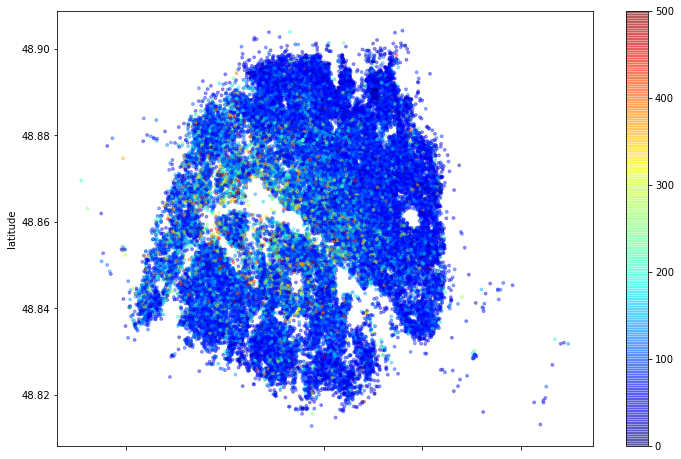

In [34]:
# plotar os imóveis pela latitude-longitude
df_clean.plot(kind = 'scatter', x = 'longitude', y = 'latitude', alpha = 0.4, c = df_clean['price'], s = 8, cmap = plt.get_cmap('jet'), figsize = (12, 8));

### **Q7. Qual é a média do mínimo de noites para aluguel (minimum_nights)?**

In [40]:
# ver a média da coluna `minimum_nights`
print(f'A média da coluna minimum_nights é: {df_clean.minimum_nights.mean():.3f}')

A média da coluna minimum_nights é: 3.874


## Conclusões

Foi realizada uma análise superficial em cima dos dados do Airbnb, mas já foi possível perceber que existem *outliers*, valores nulos. 

Mesmo essa sendo uma versão resumida dos dados já é possível ver o potencial das análises dos dados do Airbnb. Em uma próxima análise exploratória será realizada uma análise mais aprofundada utilizando os dados completos.